[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mongodb-developer/GenAI-Showcase/blob/main/notebooks/rag/multimodal_rag_mongodb_voyage_ai.ipynb)

# Building Multimodal RAG Applications with MongoDB and Voyage AI

In this notebook, you will learn how to build multimodal RAG applications using Voyage AI's multimodal embedding models and Google's multimodal LLMs.

Additionally, we will evaluate Voyage AI's VLM-based embedding model against CLIP-based embedding models on our dataset. 

# Step 1: Install required libraries

* **pymongo**: Python driver for MongoDB
* **voyageai**: Python client for Voyage AI
* **google-genai**: Python library to access Google's embedding models and LLMs via Google AI Studio
* **google-cloud-storage**: Python client for Google Cloud Storage
* **sentence-transformers**: Python library to use open-source ML mdoels from Hugging Face
* **PyMuPDF**: Python library for manipulating and analyzing PDF docs
* **Pillow**: A Python imaging library
* **tqdm**: Show progress bars for loops in Python
* **tenacity**: Python library for easily adding retries to functions

In [1]:
!pip install -qU pymongo voyageai google-genai google-cloud-storage sentence-transformers PyMuPDF Pillow tqdm tenacity

# Step 2: Setup prerequisites

* **Set the MongoDB connection string**: Follow the steps [here](https://www.mongodb.com/docs/manual/reference/connection-string/) to get the connection string from the Atlas UI.
* **Set the Voyage AI API key**: Follow the steps [here](https://docs.voyageai.com/docs/api-key-and-installation#authentication-with-api-keys) to get a Voyage AI API key.
* **Set a Gemini API key**: Follow the steps [here](https://ai.google.dev/gemini-api/docs/api-key) to get a Gemini API key via Google AI Studio.
* [In a separate terminal] **Setup Application Default Credentials (ADC)**: Follow the steps [here](https://cloud.google.com/docs/authentication/set-up-adc-local-dev-environment#google-idp) to configure ADC via the Google Cloud CLI.

In [2]:
import getpass
import os

### MongoDB

In [3]:
# Your MongoDB connection string
MONGODB_URI = getpass.getpass("Enter your MongoDB connection string: ")

Enter your MongoDB connection string:  ········


### Voyage AI

In [4]:
# Set Voyage AI API Key
os.environ["VOYAGE_API_KEY"] = getpass.getpass("Enter your Voyage AI API key: ")

Enter your Voyage AI API key:  ········


### Google

In [49]:
# Set Gemini API Key
GEMINI_API_KEY = getpass.getpass("Enter your Gemini API key: ")

Enter your Gemini API key:  ········


# Step 3: Read PDF from URL

In [6]:
from io import BytesIO

import pymupdf
import requests

In [7]:
# Download the DeepSeek paper
response = requests.get("https://arxiv.org/pdf/2501.12948")
if response.status_code != 200:
    raise ValueError(f"Failed to download PDF. Status code: {response.status_code}")
# Load the response as an in-memory file-like object
pdf_stream = BytesIO(response.content)
# Open the object as a PDF document
pdf = pymupdf.open(stream=pdf_stream, filetype="pdf")

# Step 4: Store PDF images in GCS and extract metadata for MongoDB

In [15]:
from google.cloud import storage
from tqdm import tqdm

In [17]:
# Set GCS project and bucket
GCS_PROJECT = "genai"
GCS_BUCKET = "tutorials"

In [36]:
# Instantiate the GCS client and bucket
gcs_client = storage.Client(project=GCS_PROJECT)
gcs_bucket = gcs_client.bucket(GCS_BUCKET)

In [ ]:
def upload_image_to_gcs(key: str, data: bytes) -> None:
    """
    Upload image to GCS.

    Args:
        key (str): Unique identifier for the image in the bucket.
        data (bytes): Image bytes to upload.
    """
    blob = gcs_bucket.blob(key)
    blob.upload_from_string(data, content_type="image/png")

In [24]:
docs = []

In [ ]:
zoom = 3.0
mat = pymupdf.Matrix(zoom, zoom)
# Iterate through the pages of the PDF
for n in tqdm(range(pdf.page_count)):
    temp = {}
    # Render the PDf as an image
    pix = pdf[n].get_pixmap(matrix=mat)
    # Convert the image to in-memory bytes in PNG format
    img_bytes = pix.tobytes("png")
    gcs_key = f"multimodal-rag/{n+1}.png"
    # Upload the image bytes to GCS
    upload_image_to_gcs(gcs_key, img_bytes)
    # Extract some image metadata
    temp["image"] = img_bytes
    temp["gcs_key"] = gcs_key
    temp["width"] = pix.width
    temp["height"] = pix.height
    docs.append(temp)

100%|██████████| 22/22 [00:10<00:00,  2.10it/s]


# Step 5: Add embeddings to the MongoDB documents

In [ ]:
from typing import List

from PIL import Image
from sentence_transformers import SentenceTransformer
from voyageai import Client

In [ ]:
# Instantiate the Voyage AI client
voyageai_client = Client()

In [ ]:
# Instantiate the CLIP model
clip_model = SentenceTransformer("clip-ViT-B-32")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [ ]:
def get_voyage_embedding(data: Image.Image | str, input_type: str) -> List:
    """
    Get Voyage AI embeddings for images and text.

    Args:
        data (Image.Image | str): An image or text to embed.
        input_type (str): Input type, either "document" or "query".

    Returns:
        List: Embeddings as a list.
    """
    embedding = voyageai_client.multimodal_embed(
        inputs=[[data]], model="voyage-multimodal-3", input_type=input_type
    ).embeddings[0]
    return embedding

In [ ]:
def get_clip_embedding(data: Image.Image | str) -> List:
    """
    Get CLIP embeddings for images and text.

    Args:
        data (Image.Image | str): An image or text to embed.

    Returns:
        List: Embeddings as a list.
    """
    embedding = clip_model.encode(data).tolist()
    return embedding

In [26]:
embedded_docs = []

In [ ]:
# Iterate through the MongoDB documents created previously
for doc in tqdm(docs):
    # Open the image from the in-memory bytes
    img = Image.open(BytesIO(doc["image"]))
    # Add the Voyage AI and CLIP embeddings to the document
    doc["voyage_embedding"] = get_voyage_embedding(img, "document")
    doc["clip_embedding"] = get_clip_embedding(img)
    # Remove the image bytes from the document
    del doc["image"]
    embedded_docs.append(doc)

100%|██████████| 22/22 [00:31<00:00,  1.44s/it]


In [ ]:
# Check the final list of keys in the embedded documents
embedded_docs[0].keys()

dict_keys(['gcs_key', 'width', 'height', 'voyage_embedding', 'clip_embedding'])

# Step 6: Ingest documents into MongoDB

In [29]:
from pymongo import MongoClient

In [30]:
# Create a MongoDB client
mongodb_client = MongoClient(
    MONGODB_URI, appname="devrel.showcase.multimodal_rag_mongodb_voyage_ai"
)
# Check connection to the cluster
mongodb_client.admin.command("ping")

{'ok': 1.0,
 '$clusterTime': {'clusterTime': Timestamp(1743546421, 1),
  'signature': {'hash': b'G\xb9\xa2\x9b\xa9 :\x1b$\xf7:\xe3\xad\xb6\x06ZM\xd4K\x12',
   'keyId': 7456513059255746561}},
 'operationTime': Timestamp(1743546421, 1)}

In [ ]:
# Names of the MongoDB database, collection and vector search index
DB_NAME = "mongodb"
COLLECTION_NAME = "multimodal_rag"
VS_INDEX_NAME = "vector_index"

In [ ]:
# Connect to the MongoDB collection
collection = mongodb_client[DB_NAME][COLLECTION_NAME]

In [ ]:
# Delete existing documents from the collection
collection.delete_many({})

DeleteResult({'n': 22, 'electionId': ObjectId('7fffffff0000000000000027'), 'opTime': {'ts': Timestamp(1743546428, 21), 't': 39}, 'ok': 1.0, '$clusterTime': {'clusterTime': Timestamp(1743546428, 22), 'signature': {'hash': b'\xf3\xba&\x062\xaf\xf1O\xa1\xa7\xd0#3?\xf2*\xc6\x184\xc5', 'keyId': 7456513059255746561}}, 'operationTime': Timestamp(1743546428, 21)}, acknowledged=True)

In [ ]:
# Insert the embedded documents into the collection
collection.insert_many(embedded_docs)

InsertManyResult([ObjectId('67ec683d124bcbf09ab0ad16'), ObjectId('67ec683d124bcbf09ab0ad17'), ObjectId('67ec683d124bcbf09ab0ad18'), ObjectId('67ec683d124bcbf09ab0ad19'), ObjectId('67ec683d124bcbf09ab0ad1a'), ObjectId('67ec683d124bcbf09ab0ad1b'), ObjectId('67ec683d124bcbf09ab0ad1c'), ObjectId('67ec683d124bcbf09ab0ad1d'), ObjectId('67ec683d124bcbf09ab0ad1e'), ObjectId('67ec683d124bcbf09ab0ad1f'), ObjectId('67ec683d124bcbf09ab0ad20'), ObjectId('67ec683d124bcbf09ab0ad21'), ObjectId('67ec683d124bcbf09ab0ad22'), ObjectId('67ec683d124bcbf09ab0ad23'), ObjectId('67ec683d124bcbf09ab0ad24'), ObjectId('67ec683d124bcbf09ab0ad25'), ObjectId('67ec683d124bcbf09ab0ad26'), ObjectId('67ec683d124bcbf09ab0ad27'), ObjectId('67ec683d124bcbf09ab0ad28'), ObjectId('67ec683d124bcbf09ab0ad29'), ObjectId('67ec683d124bcbf09ab0ad2a'), ObjectId('67ec683d124bcbf09ab0ad2b')], acknowledged=True)

# Step 7: Create a vector search index

In [ ]:
# Multi-vector index definition
model = {
    "name": VS_INDEX_NAME,
    "type": "vectorSearch",
    "definition": {
        "fields": [
            {
                "type": "vector",
                "path": "voyage_embedding",
                "numDimensions": 1024,
                "similarity": "cosine",
            },
            {
                "type": "vector",
                "path": "clip_embedding",
                "numDimensions": 512,
                "similarity": "cosine",
            },
        ]
    },
}

In [ ]:
# Create the VS index
collection.create_search_index(model=model)

# Step 8: Retrieve documents using vector search

In [ ]:
def get_image_from_gcs(key: str) -> bytes:
    """
    Get image bytes from GCS.

    Args:
        key (str): Identifier for the image in the bucket.

    Returns:
        bytes: Image bytes.
    """
    blob = gcs_bucket.blob(key)
    image_bytes = blob.download_as_bytes()
    return image_bytes

In [ ]:
def vector_search(
    user_query: str, model: str, display_images: bool = True
) -> List[str]:
    """
    Perform vector search and display images, and return the GCS keys.

    Args:
        user_query (str): User query string.
        model (str): Embedding model to use, either "voyage" or "clip".
        display_images (bool, optional): Whether or not to display images. Defaults to True.

    Returns:
        List[str]: List of GCS keys.
    """
    # Get query embedding based on the model specified
    if model == "voyage":
        query_embedding = get_voyage_embedding(user_query, "query")
    elif model == "clip":
        query_embedding = get_clip_embedding(user_query)
    # Define the VS aggregation pipeline
    pipeline = [
        {
            "$vectorSearch": {
                "index": VS_INDEX_NAME,
                "queryVector": query_embedding,
                "path": f"{model}_embedding",
                "numCandidates": 150,
                "limit": 5,
            }
        },
        {
            "$project": {
                "_id": 0,
                "gcs_key": 1,
                "width": 1,
                "height": 1,
                "score": {"$meta": "vectorSearchScore"},
            }
        },
    ]

    # Execute the aggregation pipeline
    results = collection.aggregate(pipeline)

    gcs_keys = []
    # For each VS result
    for result in results:
        gcs_key = result["gcs_key"]
        # If display_images is True, display the image
        if display_images is True:
            img = Image.open(BytesIO(get_image_from_gcs(gcs_key)))
            print(f"{result['score']}\n")
            display(img)
        # Append the GCS key of the image to a list
        gcs_keys.append(gcs_key)

    return gcs_keys

0.7585833072662354



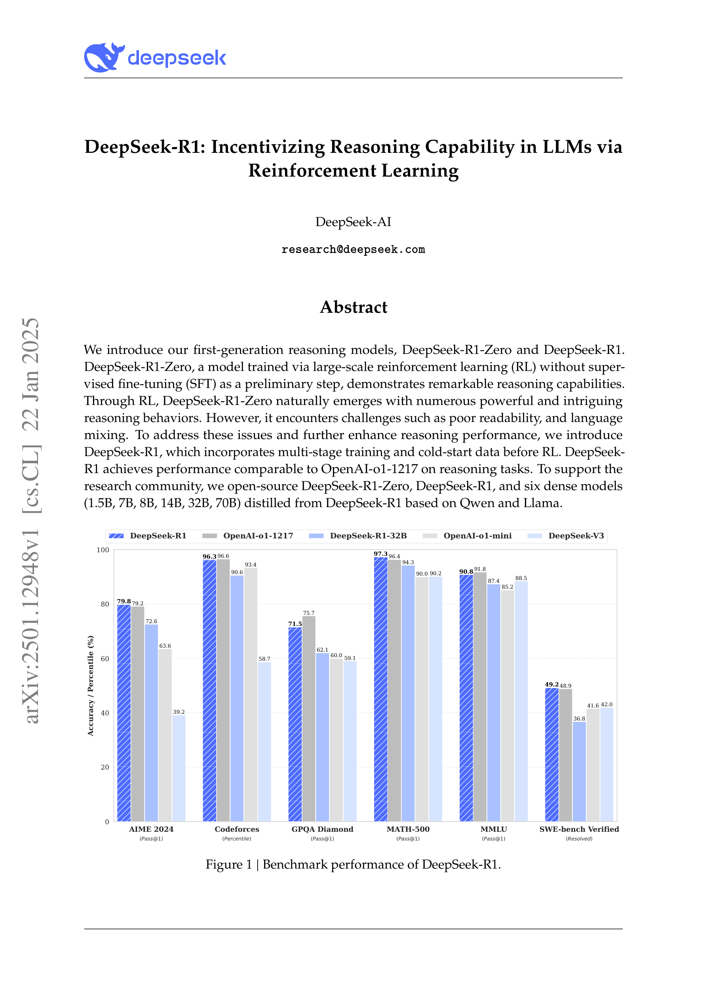

0.7482262253761292



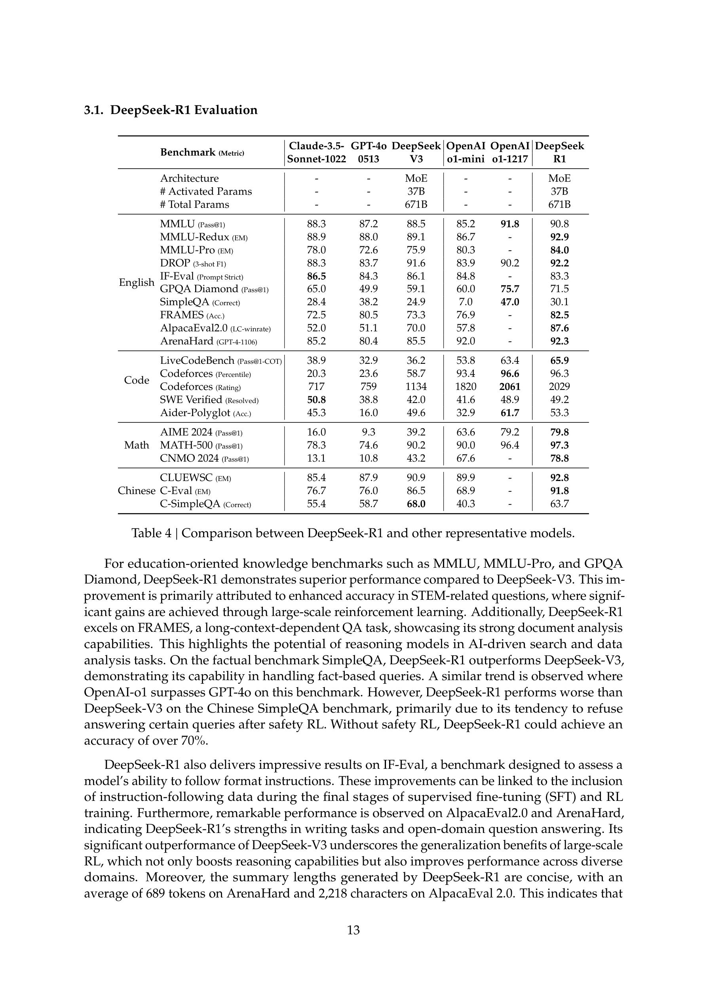

0.7399106025695801



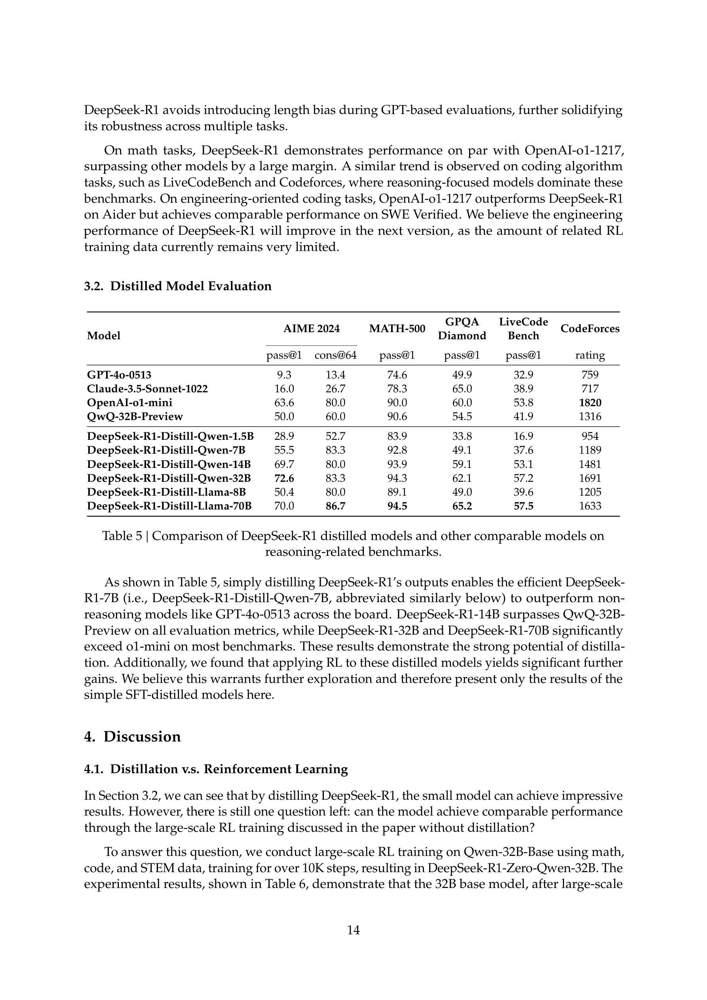

0.7107774019241333



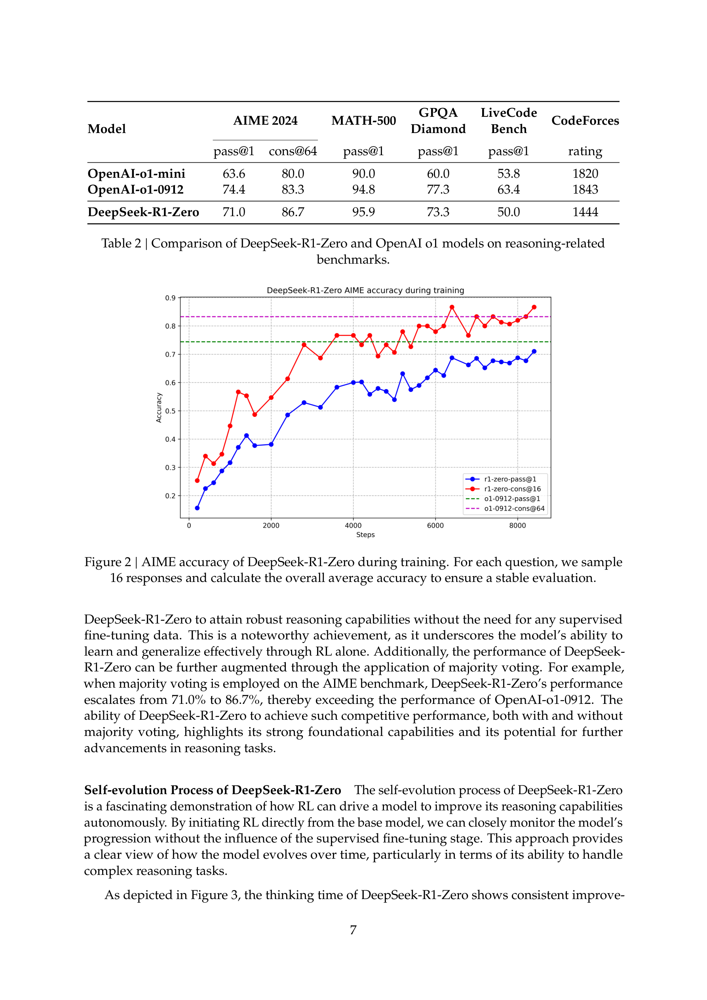

0.69964599609375



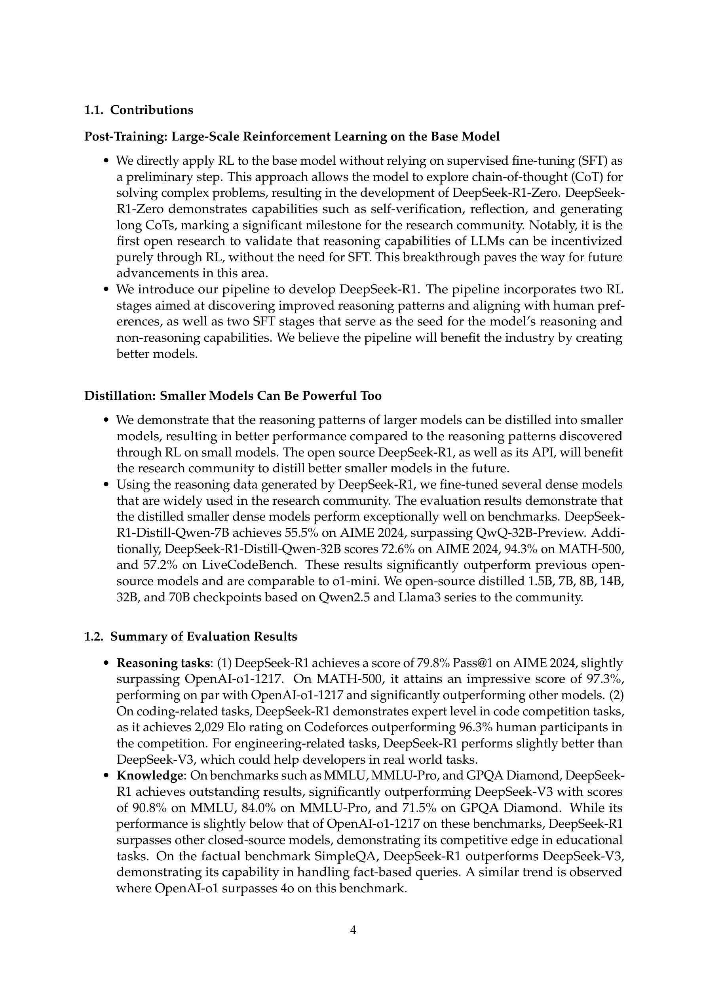

['multimodal-rag/1.png',
 'multimodal-rag/13.png',
 'multimodal-rag/14.png',
 'multimodal-rag/7.png',
 'multimodal-rag/4.png']

In [ ]:
# Test the vector search function with the Voyage AI model
vector_search(
    "Summarize the Pass@1 accuracy of Deepseek R1 against other models.",
    "voyage",
    display_images=True,
)

0.6344423294067383



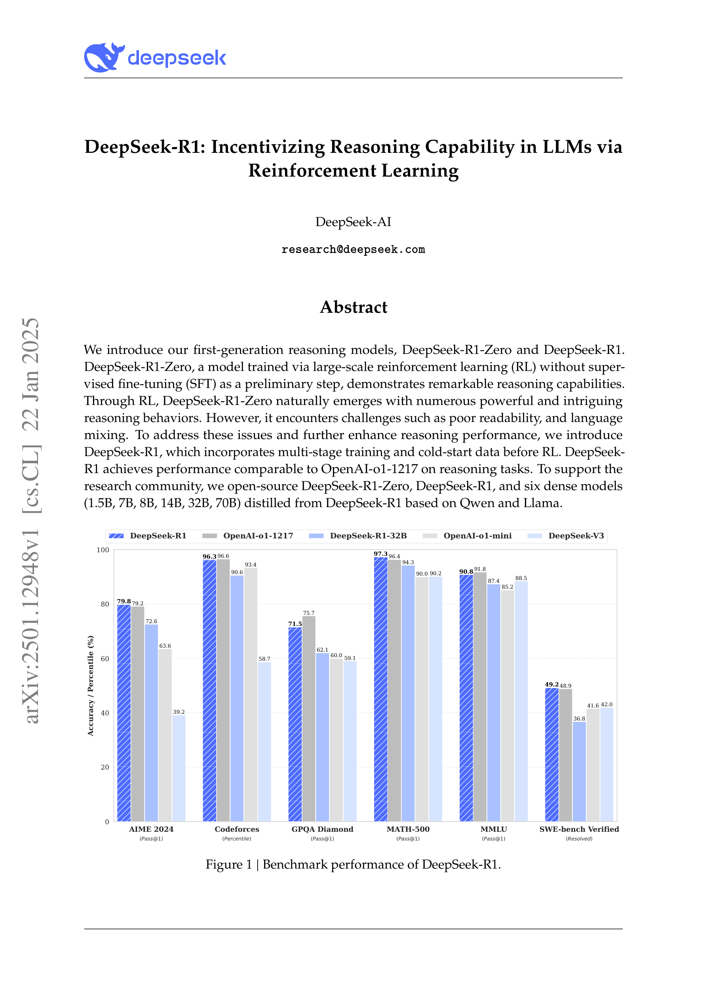

0.6320553421974182



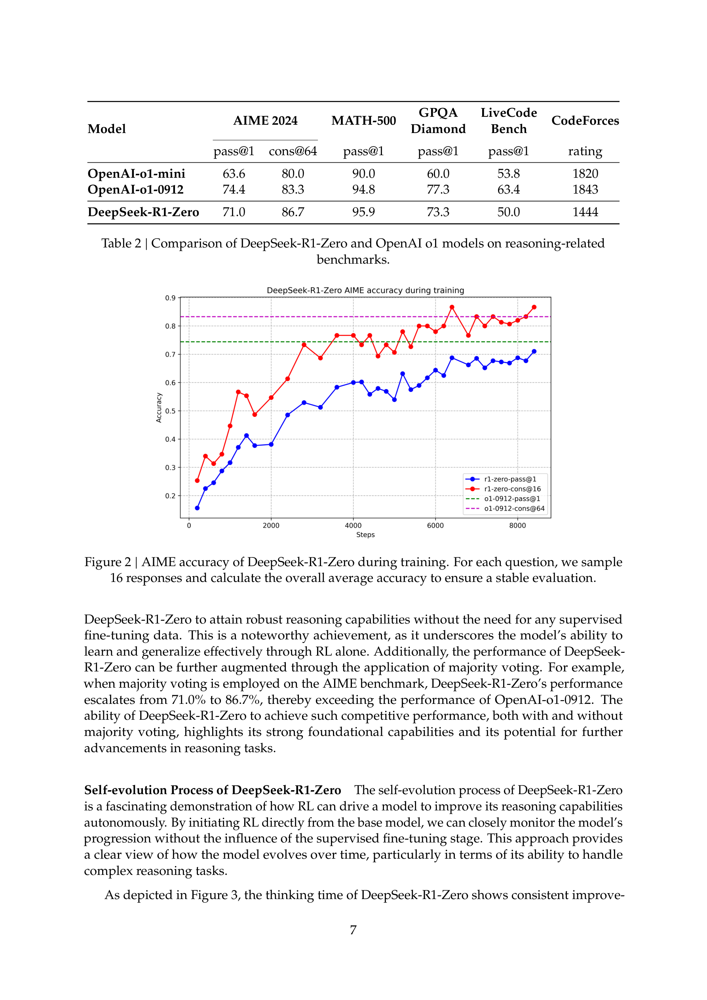

0.6312342882156372



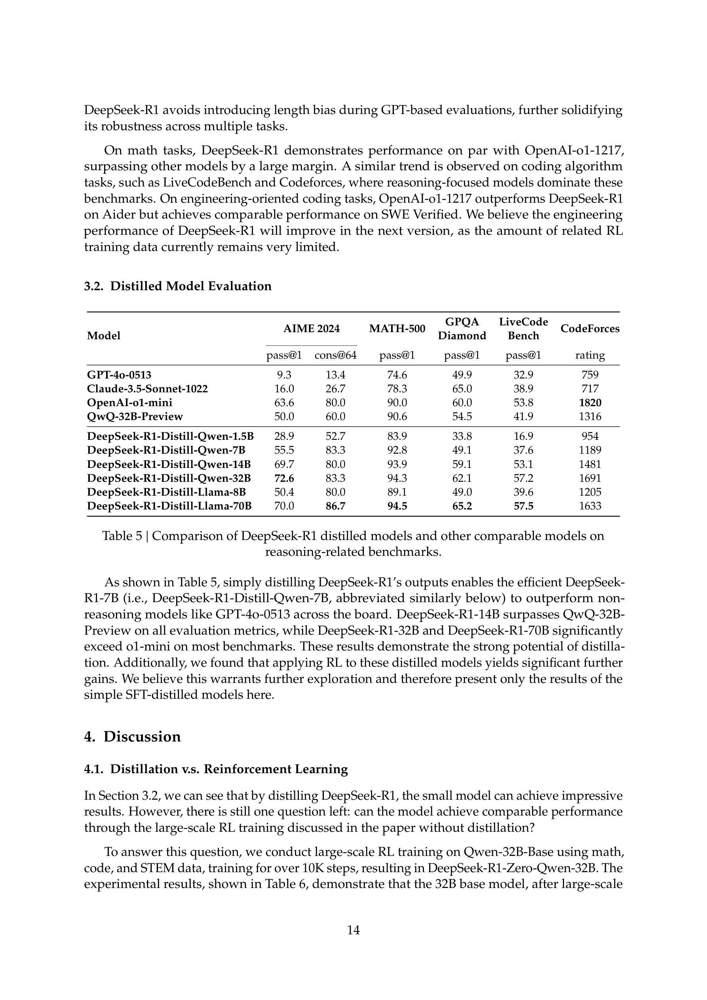

0.6270501017570496



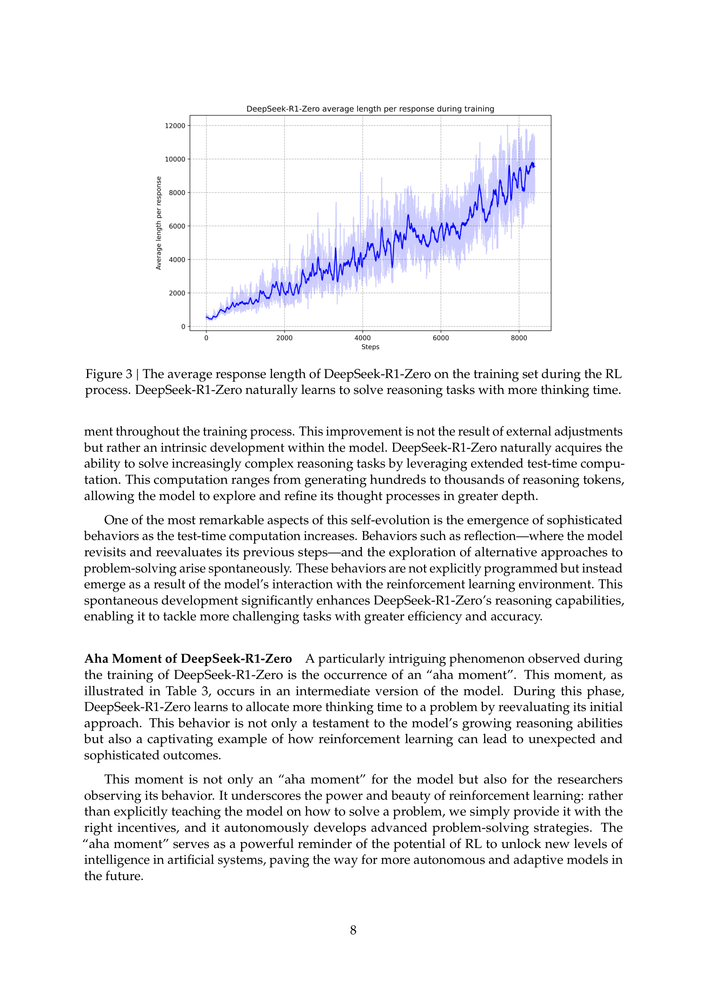

0.6267095804214478



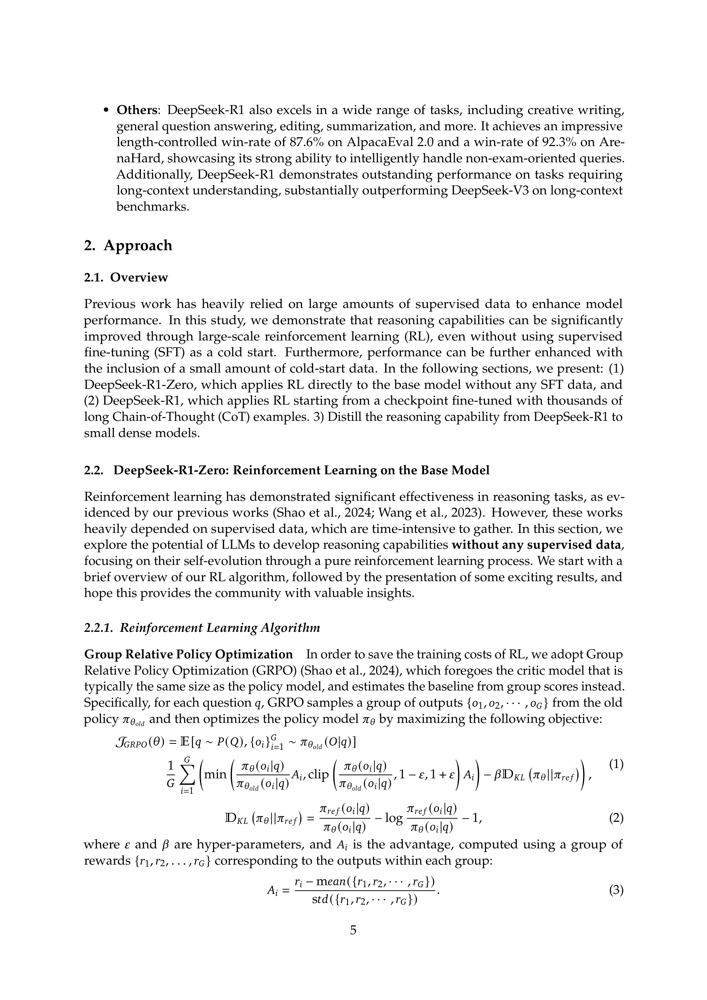

['multimodal-rag/1.png',
 'multimodal-rag/7.png',
 'multimodal-rag/14.png',
 'multimodal-rag/8.png',
 'multimodal-rag/5.png']

In [ ]:
# Test the vector search function with the CLIP model
vector_search(
    "Summarize the Pass@1 accuracy of Deepseek R1 against other models.",
    "clip",
    display_images=True,
)

# Step 9: Create a multimodal RAG app

In [44]:
from google import genai
from google.genai import types

In [ ]:
# Instantiate the Gemini client
gemini_client = genai.Client(api_key=GEMINI_API_KEY)

In [ ]:
# Gemini LLm to use
LLM = "gemini-2.0-flash"

In [ ]:
def generate_answer(user_query: str, model: str) -> str:
    """
    Generate answer to the user question using a Gemini multimodal LLM.

    Args:
        user_query (str): User query string.
        model (str): Embedding model to use, either "voyage" or "clip".

    Returns:
        str: LLM generated answer.
    """
    # Get the GCS keys of the images returned by the vector search
    gcs_keys = vector_search(user_query, model, display_images=False)
    # Get the images from GCS and open them
    images = [Image.open(BytesIO(get_image_from_gcs(key))) for key in gcs_keys]
    prompt = f"Answer the question based only on the provided context. If the context is empty, say I DON'T KNOW\n\nQuestion:{user_query}\n\nContext:\n"
    # Prompt to the LLM consisting of the system prompt and the images
    messages = [prompt] + images
    # Get a response from the LLM
    response = gemini_client.models.generate_content(
        model=LLM,
        contents=messages,
        config=types.GenerateContentConfig(temperature=0.0),
    )
    return response.text

In [ ]:
generate_answer(
    "Summarize the Pass@1 accuracy of Deepseek R1 against other models.", "voyage"
)

'DeepSeek-R1 achieves a Pass@1 accuracy of 79.8% on AIME 2024, 97.3% on MATH-500, 90.8% on MMLU, and 71.5% on GPQA Diamond. It outperforms OpenAI-o1-1217 on MATH-500 and Codeforces. It performs slightly better than DeepSeek-V3 on SWE-bench Verified. However, its performance is slightly below that of OpenAI-o1-1217 on benchmarks like MMLU-Pro and GPQA Diamond.\n'

In [ ]:
generate_answer(
    "Summarize the Pass@1 accuracy of Deepseek R1 against other models.", "clip"
)

"Based on the provided context, here's a summary of the Pass@1 accuracy of Deepseek R1 against other models:\n\n*   **DeepSeek-R1 vs. OpenAI-01-mini and OpenAI-01-0912:** DeepSeek-R1 outperforms both OpenAI-01-mini and OpenAI-01-0912 on the MATH-500 and GPOA Diamond benchmarks. DeepSeek-R1 also outperforms OpenAI-01-mini on the AIME 2024 benchmark.\n*   **DeepSeek-R1 vs. Distilled Models:** DeepSeek-R1-Distill-Qwen-7B outperforms QWQ-32B-Preview on all evaluation metrics. DeepSeek-R1-14B surpasses QWQ-32B-Preview on all evaluation metrics. DeepSeek-R1-Distill-Llama-70B exceeds OpenAI-32B-Preview on entire on non-benchmark tasks.\n*   **DeepSeek-R1 vs. DeepSeek-V3:** DeepSeek-R1 demonstrates outstanding performance on tasks requiring long-context understanding, substantially outperforming DeepSeek-V3 on long-context benchmarks.\n"

# Step 10: Evaluating retrieval and generation

In [55]:
import json
import re

from tenacity import retry, wait_random_exponential

In [56]:
eval_dataset = [
    # Image-Based Questions (Answers rely on figures/tables)
    {
        "question": "How does DeepSeek-R1-Zero's accuracy on the AIME 2024 benchmark improve during RL training?",
        "answer": "The accuracy measured by the average pass@1 score increases from 15.6% to 71.0% pass@1 as a result of RL training.",
        "page_numbers": [6, 7, 3, 1, 13],
    },
    {
        "question": "How does DeepSeek-R1-Zero compare to OpenAI models on the MATH-500 benchmark?",
        "answer": "DeepSeek-R1-Zero achieves 95.9% pass@1, outperforming OpenAI-o1-0912 at 94.8% as well as OpenAI-o1-mini at 90%.",
        "page_numbers": [7, 1, 4, 13, 14],
    },
    {
        "question": "What trend is observed in the model's response length during RL training?",
        "answer": "Response length increases consistently as RL training progresses owing to more reasoning tokens used as the model learns to explore and refine its thought processes in greater depth.",
        "page_numbers": [8, 7, 6, 3, 9],
    },
    {
        "question": "How does DeepSeek-R1 perform on coding tasks compared to OpenAI-o1-1217?",
        "answer": "DeepSeek-R1 scores higher LiveCodeBench and SWE Verified but lower on Codeforces and Aider-Polyglot.",
        "page_numbers": [13, 14, 1, 3, 7],
    },
    {
        "question": "Summarize the performance of distilled 32B models on the AIME 2024 benchmark?",
        "answer": "DeepSeek-R1-Distill-Qwen 14B and 32B, and DeepSeek-R1-Distill-Llama 8B and 70B surpass models such as GPT-4o-0513, Claude-3.5-Sonnet-1022, OpenAI-o1-mini and QwQ-32B-Preview on the AIME 2024 benchmark.",
        "page_numbers": [15, 14, 4, 3, 11],
    },
    # Text-Based Questions (Answers rely on text only)
    {
        "question": "What reinforcement learning algorithm replaces traditional critic models in the paper?",
        "answer": "Group Relative Policy Optimization (GRPO), which uses group scores to estimate baselines instead.",
        "page_numbers": [5, 6, 3, 4, 15],
    },
    {
        "question": "How does DeepSeek-R1 address readability issues present in DeepSeek-R1-Zero?",
        "answer": "It uses cold-start data and multi-stage training (SFT + RL) to improve output clarity.",
        "page_numbers": [9, 10, 5, 3, 4],
    },
    {
        "question": "What reward types guide DeepSeek-R1-Zero's RL training process?",
        "answer": "Accuracy rewards (correct answers) and format rewards (structured output with tags).",
        "page_numbers": [6, 10, 5, 15, 3],
    },
    {
        "question": "Why is Monte Carlo Tree Search (MCTS) challenging for reasoning tasks?",
        "answer": "Token generation creates an exponentially large search space, and value models are hard to train reliably.",
        "page_numbers": [15, 16, 5, 8, 11],
    },
    {
        "question": "What is supervised fine tuning?",
        "answer": "Supervised fine-tuning (SFT) refers to a training approach where a model is fine-tuned on specific data examples to improve its performance in targeted tasks.",
        "page_numbers": [10, 4, 9, 3, 5],
    },
]

In [ ]:
def calculate_rr(ground_truth: List[int], retrieved: List[int]) -> float:
    """
    Calculate reciprocal rank for a given query.

    Args:
        ground_truth (List[int]): List of relevant page numbers.
        retrieved (List[int]): List of retrieved page numbers.

    Returns:
        float: Reciprocal rank.
    """
    for i, doc_id in enumerate(retrieved):
        if doc_id in ground_truth:
            return 1 / (i + 1)
    return 0.0

In [ ]:
def recall_at_k(ground_truth: List[int], retrieved: List[int], k: int = 1) -> float:
    """
    Calculate recall at k for a given query

    Args:
        ground_truth (List[int]): List of relevant page numbers.
        retrieved (List[int]): List of retrieved page numbers.
        k (int, optional): Position to calculate recall at. Defaults to 1.

    Returns:
        float: Recall at k.
    """
    retrieved_at_k = set(retrieved[:k])
    ground_truth_set = set(ground_truth)
    relevant_retrieved = len(retrieved_at_k.intersection(ground_truth_set))
    recall = relevant_retrieved / len(ground_truth_set)
    return recall

In [ ]:
def get_page_num(gcs_key: str) -> int:
    """
    Extract page number from the GCS key.

    Args:
        gcs_key (str):GCS key for the image.

    Returns:
        int: Page number in the source PDF.
    """
    match = re.match(r"multimodal-rag/(\d+)\.png", gcs_key)
    return int(match.group(1))

In [ ]:
@retry(wait=wait_random_exponential(multiplier=1, max=60))
def eval_faithfulness(
    query: str, ground_truth_answer: str, generated_answer: str
) -> int:
    """
    Evaluate faithfulness of the LLM-generated answer.

    Args:
        ground_truth_answer (str): Ground truth answer.
        generated_answer (str): LLM-generated answer.

    Returns:
        int: Faithfulness rating between 1 to 5.
    """
    prompt = f"""Evaluate the faithfulness of the following AI-generated answer compared to the ground truth answer.

    QUESTION: {query}
    
    GROUND TRUTH ANSWER: {ground_truth_answer}
    
    AI-GENERATED ANSWER: {generated_answer}
    
    Rate the faithfulness of the AI-generated answer on a scale of 1 to 5, where:
    1 = Completely unfaithful (contains major factual errors or contradictions)
    2 = Mostly unfaithful (contains several factual errors or misinterpretations)
    3 = Partially faithful (contains minor factual errors while getting some things right)
    4 = Mostly faithful (accurately captures most information with minimal errors)
    5 = Completely faithful (fully aligned with the ground truth, no factual errors)
    
    Provide your rating and a brief explanation of your reasoning.
    
    Return your answer as a JSON object with two keys namely "rating" (integer) and "reasoning"
    """
    response = gemini_client.models.generate_content(
        model=LLM,
        contents=[prompt],
        config=types.GenerateContentConfig(
            temperature=0.0, responseMimeType="application/json"
        ),
    )
    result = json.loads(response.text)
    return result["rating"]

In [ ]:
def eval_model(model: str, eval_dataset: List[dict]) -> None:
    """
    Evaluate retrieval and generation performance of Voyage AI and CLIP models.

    Args:
        model (str): Model to evaluate, one of "voyage" or "clip".
        eval_dataset (List[dict]): Evaluation dataset containing questions, ground truth answers, and relevant page numbers.
    """
    print(f"Model: {model}")
    rr = 0
    recall_at_5 = 0
    faithfulness = 0
    len_dataset = len(eval_dataset)
    for item in tqdm(eval_dataset):
        query = item["question"]
        answer = item["answer"]
        relevant_page_nums = item["page_numbers"]
        retrieved_keys = vector_search(query, model, display_images=False)
        retrieved_page_nums = [get_page_num(key) for key in retrieved_keys]
        rr += calculate_rr(relevant_page_nums, retrieved_page_nums)
        recall_at_5 += recall_at_k(relevant_page_nums, retrieved_page_nums, 5)
        generated_answer = generate_answer(query, model)
        faithfulness += eval_faithfulness(query, answer, generated_answer)
    print(f"MRR: {rr/len_dataset}")
    print(f"Avg. Recall @5: {recall_at_5/len_dataset}")
    print(f"Avg. faithfulness: {faithfulness/len_dataset}")

In [62]:
# Performance on image-based qs
eval_model("voyage", eval_dataset[:5])

Model: voyage


100%|██████████| 5/5 [00:31<00:00,  6.24s/it]

MRR: 1.0
Avg. Recall @5: 0.68
Avg. faithfulness: 3.4


In [458]:
# Performance on image-based qs
eval_model("clip", eval_dataset[:5])

Model: clip


100%|██████████| 5/5 [00:23<00:00,  4.73s/it]

MRR: 0.8
Avg. Recall @5: 0.56
Avg. faithfulness: 2.8


In [459]:
# Performance on text-based qs
eval_model("voyage", eval_dataset[5:])

Model: voyage


100%|██████████| 5/5 [00:24<00:00,  4.99s/it]

MRR: 0.8666666666666666
Avg. Recall @5: 0.52
Avg. faithfulness: 3.4


In [460]:
# Performance on text-based qs
eval_model("clip", eval_dataset[5:])

Model: clip


100%|██████████| 5/5 [00:23<00:00,  4.69s/it]

MRR: 0.8
Avg. Recall @5: 0.32
Avg. faithfulness: 3.2


In [461]:
# Overall performance
eval_model("voyage", eval_dataset)

Model: voyage


100%|██████████| 10/10 [00:48<00:00,  4.84s/it]

MRR: 0.9333333333333332
Avg. Recall @5: 0.6
Avg. faithfulness: 3.3


In [462]:
# Overall performance
eval_model("clip", eval_dataset)

Model: clip


100%|██████████| 10/10 [00:42<00:00,  4.27s/it]

MRR: 0.8
Avg. Recall @5: 0.4400000000000001
Avg. faithfulness: 3.0
